
# ỨNG DỤNG CLUSTERING ĐỂ PHÁT HIỆN ẢNH TRÙNG

1. Yêu cầu chung: Dùng kỹ thuật clustering để tạo công cụ hỗ trợ phát hiện các ảnh trùng nhau

2. Yêu cầu cụ thể:
  - Input: Danh sách các ảnh được lưu trong tập tin, ví dụ CarDataset-Splits-1-Train.csv (xem mô tả https://colab.research.google.com/drive/1gf0GzvW0tHddKtuvMUNIvglUT-J6oW6S?usp=sharing)
  - Output: Danh sách các clusters và hiển thị các ảnh trong cluster

3. Hướng dẫn:
  - Bước 1:
    - Mỗi ảnh cần thực hiện bước rút trích đặc trưng (feature extraction), biểu diễn dưới dạng một vector đặc trưng d chiều (d-dimension).
    - Có nhiều công cụ hỗ trợ bước rút trích đặc trưng, trong bài tập này, chúng ta sẽ chọn một công cụ sao cho tốc độ xử lý nhanh nhưng kết quả tốt. Các mô hình MobileNet (https://keras.io/api/applications/mobilenet/) có thể được dùng vì đáp ứng các tiêu chí này.
  - Bước 2:
    - Chọn một thuật toán clustering - ví dụ K-Means (số lượgn clusters K=5)
    - Ghi kết quả clustering ra tập tin - thay CategoryID bằng ClusterID
  - Bước 3:
    - Hiển thị kết quả clustering - kế thừa kết quả của bài tập Hiển thị dữ liệu https://colab.research.google.com/drive/1rHbKlJd7O9E49SsJlHnZNKcyTbwXT_Ls?usp=sharing
    - Từ kết quả hiển thị, nếu các ảnh nhìn trùng nhau, nhưng tên tập tin khác nhau thì có thể đưa vào danh sách hậu kiểm.

## Thông tin của tác giả, ngày cập nhật
Thành viên nhóm:


*   Tăng Gia Hân - 22520394
*   Tăng Mỹ Hân - 22520395


Ngày cập nhật: 10/01/2025
 

# Import thư viện cần thiết

In [1]:
import cv2
import os
import torch
import random

import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import plotly.express as px

from tensorflow.keras.applications import MobileNet

from PIL import Image
from tqdm import tqdm
from skimage.io import imread
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.spatial.distance import euclidean
from tensorflow.keras.preprocessing import image
from sklearn.metrics.pairwise import cosine_similarity
from skimage.metrics import structural_similarity as ssim
from tensorflow.keras.applications.mobilenet import preprocess_input

In [3]:
# Các hằng số cần thiết
IMAGE_SIZE = (224, 224)
NUM_CLUSTERS = 9         # Số lượng clusters (K)
INPUT_CSV = "/kaggle/input/cardataset-csv/CarDataset.csv"  # File input
OUTPUT_CSV = "CarDataset-Clusters.csv"       # File output chứa ClusterID
BASE_IMAGE_FOLDER = "/kaggle/input/data-car-public/Public"  # Thư mục gốc chứa ảnh
FEATURES_FILE = "extracted_features.npy"
ERROR_FILE = "Error_ImagePath.csv"
DUPLICATE_CSV = "DuplicateImages.csv"  # File output chứa danh sách ảnh trùng lặp

In [4]:
# Đọc file cardataset-csv
df = pd.read_csv(INPUT_CSV)
image_paths = df["ImageFullPath"].tolist()

In [5]:
df

,ImageFullPath,CategoryID
0,Mazda/22520779-22521587.Mazda.12.jpg,4
1,Mazda/22520779-22521587.Mazda.197.jpg,4
2,Mazda/22520779-22521587.Mazda.114.jpg,4
3,Mazda/22520779-22521587.Mazda.94.jpg,4
4,Mazda/22520779-22521587.Mazda.109.jpg,4
...,...,...
34824,Honda/22520683-22520811-22521465.Honda.12.jpg,1
34825,Honda/22520683-22520811-22521465.Honda.13.jpg,1
34826,Honda/22520683-22520811-22521465.Honda.14.jpg,1
34827,Honda/22520683-22520811-22521465.Honda.15.jpg,1


# Feature Extraction

In [6]:
# Hàm trích xuất đặc trưng

def extract_features(image_paths, batch_size=32, input_shape=(224, 224), save_to_file=None, error_file=ERROR_FILE):
    # Load model MobileNet không có lớp top và dùng pooling trung bình
    base_model = MobileNet(weights="imagenet", include_top=False, pooling="avg")
    features = []
    valid_paths = []
    Error_paths = []

    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths[i:i + batch_size]
        batch_images = []

        for path_from_csv in batch_paths:
            full_path = os.path.join(BASE_IMAGE_FOLDER, path_from_csv)
            if not os.path.exists(full_path):
                print(f"Warning: File not found - {full_path}")
                Error_paths.append(path_from_csv)
                continue

            try: 
                img = image.load_img(full_path, target_size=input_shape)
                x = image.img_to_array(img)
                batch_images.append(preprocess_input(x))
                valid_paths.append(path_from_csv)
            
            except Exception as e:
                print(f"Warning: Unable to read image - {full_path}. Error: {e}")
                continue

        if batch_images:
            batch_images = np.array(batch_images)
            batch_features = base_model.predict(batch_images, verbose=0)
            features.extend(batch_features)

    features = np.array(features)
    if save_to_file:
        np.save(save_to_file, features)
        print(f"Đã lưu đặc trưng vào file {save_to_file}")

    error_df = pd.DataFrame(Error_paths, columns=["Error_paths"])
    error_df.to_csv(error_file, index=False)

    return features, valid_paths

In [7]:
print("Trích xuất đặc trưng ảnh...")
features, valid_paths = extract_features(image_paths, save_to_file=FEATURES_FILE)
print(f"Đã trích xuất đặc trưng cho {len(valid_paths)} ảnh.")

Trích xuất đặc trưng ảnh...


<ipython-input-6-bd4ebc6a10d3>:5: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNet(weights="imagenet", include_top=False, pooling="avg")


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Đã lưu đặc trưng vào file extracted_features.npy
Đã trích xuất đặc trưng cho 34773 ảnh.


# Clustering

In [8]:
# Hàm clustering

def cluster_images(features, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(features)
    return kmeans.labels_

In [9]:
print("Phân cụm ảnh với K-Means...")
cluster_labels = cluster_images(features, NUM_CLUSTERS)
print("Phân cụm hoàn tất.")

output_df = pd.DataFrame({"ImageFullPath": valid_paths, "ClusterID": cluster_labels})
output_df.to_csv(OUTPUT_CSV, index=False)
print(f"Kết quả đã lưu vào {OUTPUT_CSV}")


Phân cụm ảnh với K-Means...


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Phân cụm hoàn tất.
Kết quả đã lưu vào CarDataset-Clusters.csv


In [10]:
output_df

,ImageFullPath,ClusterID
0,Mazda/22520779-22521587.Mazda.12.jpg,3
1,Mazda/22520779-22521587.Mazda.197.jpg,2
2,Mazda/22520779-22521587.Mazda.114.jpg,4
3,Mazda/22520779-22521587.Mazda.94.jpg,2
4,Mazda/22520779-22521587.Mazda.109.jpg,3
...,...,...
34768,Honda/22520683-22520811-22521465.Honda.12.jpg,1
34769,Honda/22520683-22520811-22521465.Honda.13.jpg,1
34770,Honda/22520683-22520811-22521465.Honda.14.jpg,1
34771,Honda/22520683-22520811-22521465.Honda.15.jpg,1


# Visualization

In [11]:
# Hàm hiển thị kết quả clustering

def visualize_clusters(csv_file, num_imgs_per_row=10, img_height=150, img_width=150):
    data = pd.read_csv(csv_file)
    unique_clusters = sorted(data["ClusterID"].unique())
    num_rows = len(unique_clusters)
    fig, axes = plt.subplots(num_rows, num_imgs_per_row, figsize=(num_imgs_per_row * 2, num_rows * 2))
    plt.subplots_adjust(hspace=0.5)

    if num_rows == 1:
        axes = [axes]

    for row_idx, cluster in enumerate(unique_clusters):
        cluster_imgs = data[data["ClusterID"] == cluster]["ImageFullPath"].tolist()
        random_imgs = random.sample(cluster_imgs, min(len(cluster_imgs), num_imgs_per_row))

        for col_idx in range(num_imgs_per_row):
            ax = axes[row_idx][col_idx] if num_rows > 1 else axes[col_idx]
            ax.axis('off')

            if col_idx < len(random_imgs):
                path = random_imgs[col_idx]
                img_path = os.path.join(BASE_IMAGE_FOLDER, path)
                if os.path.exists(img_path): 
                    img = cv2.imread(img_path)
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (img_width, img_height))
                    ax.imshow(img)
            else:
                ax.set_visible(False)

        axes[row_idx][0].text(-50, 0.5, f"Cluster {cluster}", ha="center", va="center",
                              fontsize=12, rotation=0)

    plt.tight_layout()
    plt.show()

Hiển thị kết quả clustering...


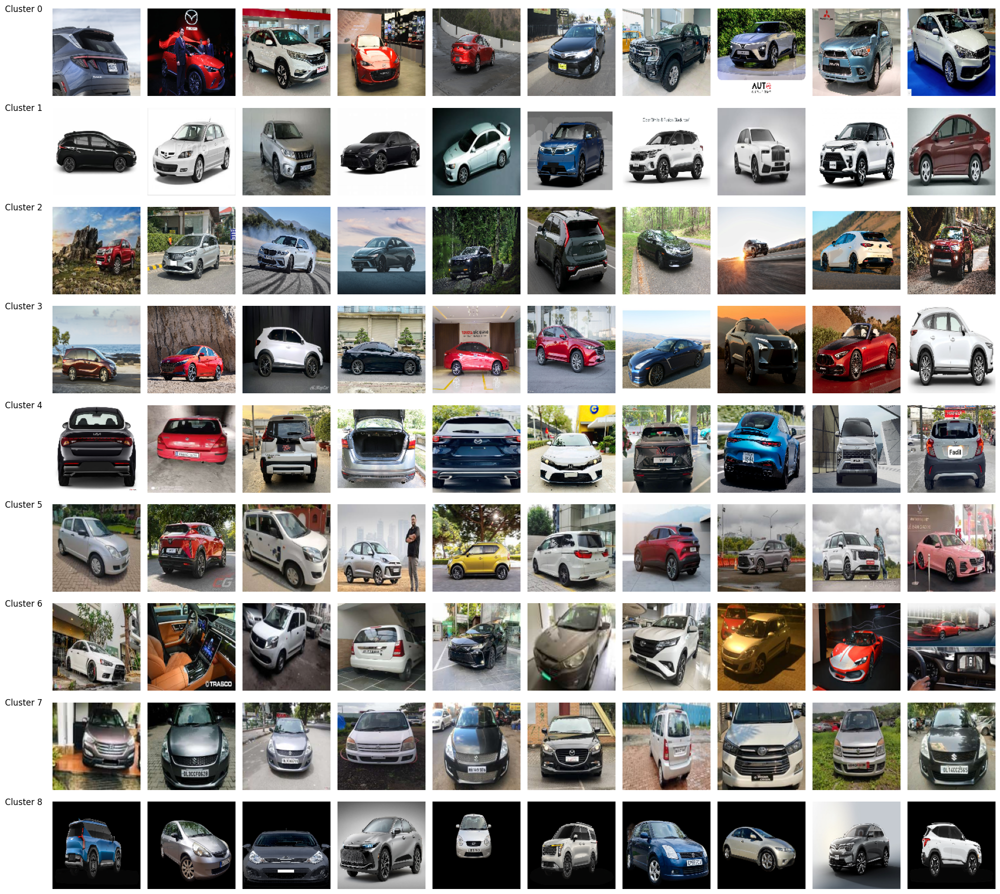

In [12]:
print("Hiển thị kết quả clustering...")
visualize_clusters(OUTPUT_CSV)

# tính mức độ tương đồng giữa các ảnh và phát hiện các ảnh trùng lặp
Tính toán mức độ tương đồng:

* Dùng khoảng cách cosine để đo lường sự tương đồng giữa các vector đặc trưng.
* Xác định một ngưỡng (threshold) để quyết định hai ảnh được coi là trùng lặp.

Lưu danh sách lỗi (duplicate images):

* Tạo một danh sách chứa các cặp ảnh có mức độ tương đồng vượt ngưỡng.

In [13]:
from sklearn.metrics.pairwise import cosine_similarity
from collections import defaultdict


# Hàm tìm ảnh trùng lặp trong từng cụm
def find_duplicate_images(features, paths, cluster_labels, similarity_threshold=0.9):
    """
    Tìm các cặp ảnh trùng lặp trong từng cụm dựa trên ngưỡng tương đồng.
    """
    duplicates = []
    cluster_dict = defaultdict(list)

    # Gom ảnh theo từng cụm
    for idx, cluster_id in enumerate(cluster_labels):
        cluster_dict[cluster_id].append(idx)

    # Duyệt qua từng cụm
    for cluster_id, indices in cluster_dict.items():
        print(f"Đang kiểm tra cụm {cluster_id} với {len(indices)} ảnh.")
        cluster_features = features[indices]
        cluster_paths = [paths[i] for i in indices]

        # Tính ma trận tương đồng cosine cho cụm hiện tại
        similarity_matrix = cosine_similarity(cluster_features)

        # Tìm các cặp ảnh trùng lặp trong cụm
        for i in range(len(indices)):
            for j in range(i + 1, len(indices)):
                if similarity_matrix[i, j] > similarity_threshold:
                    duplicates.append((cluster_paths[i], cluster_paths[j], similarity_matrix[i, j]))
    
    return duplicates

def save_duplicates_to_csv(duplicates, output_csv):
    """
    Lưu các cặp ảnh trùng lặp vào file CSV.
    """
    duplicate_df = pd.DataFrame(duplicates, columns=["Image1", "Image2", "Similarity"])
    duplicate_df.to_csv(output_csv, index=False)
    print(f"Danh sách ảnh trùng lặp đã được lưu vào {output_csv}")

In [14]:
features = np.load(FEATURES_FILE)
paths = pd.read_csv(OUTPUT_CSV)["ImageFullPath"].tolist()

# Đồng bộ số lượng vector đặc trưng và đường dẫn ảnh
if len(paths) > features.shape[0]:
    print(f"Cảnh báo: Có {len(paths) - features.shape[0]} đường dẫn dư thừa. Đang loại bỏ...")
    paths = paths[:features.shape[0]]

print("Tìm các ảnh trùng lặp...")
duplicates = find_duplicate_images(features, paths, cluster_labels, similarity_threshold=0.9)
print(f"Tìm thấy {len(duplicates)} cặp ảnh trùng lặp.")

print("Lưu danh sách ảnh trùng lặp vào CSV...")
save_duplicates_to_csv(duplicates, DUPLICATE_CSV)

Tìm các ảnh trùng lặp...
Đang kiểm tra cụm 3 với 5715 ảnh.
Đang kiểm tra cụm 2 với 4296 ảnh.
Đang kiểm tra cụm 4 với 3293 ảnh.
Đang kiểm tra cụm 1 với 3474 ảnh.
Đang kiểm tra cụm 0 với 4233 ảnh.
Đang kiểm tra cụm 7 với 2860 ảnh.
Đang kiểm tra cụm 5 với 5117 ảnh.
Đang kiểm tra cụm 8 với 2191 ảnh.
Đang kiểm tra cụm 6 với 3594 ảnh.
Tìm thấy 8279 cặp ảnh trùng lặp.
Lưu danh sách ảnh trùng lặp vào CSV...
Danh sách ảnh trùng lặp đã được lưu vào DuplicateImages.csv


Hiển thị các cặp ảnh trùng lặp...


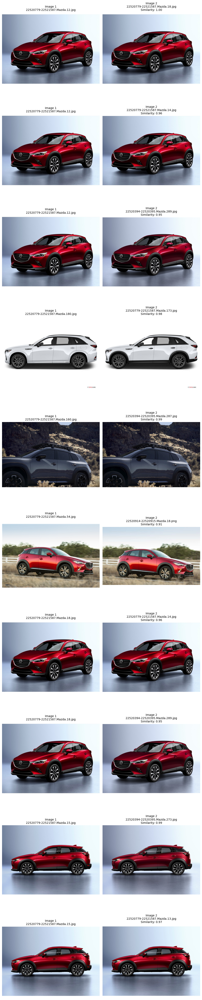

In [15]:
def plot_image_pairs(duplicates, num_pairs=20, img_size=(150, 150)):
    """
    Vẽ các cặp ảnh trùng lặp trên một biểu đồ.
    
    Parameters:
    - duplicates: Danh sách các cặp ảnh (paths) và giá trị tương đồng (similarity).
    - num_pairs: Số lượng cặp ảnh muốn hiển thị.
    - img_size: Kích thước hiển thị của mỗi ảnh.
    """
    if not duplicates:
        print("Không có cặp ảnh trùng lặp để hiển thị.")
        return

    num_pairs = min(len(duplicates), num_pairs)  # Giới hạn số cặp ảnh hiển thị
    fig, axes = plt.subplots(num_pairs, 2, figsize=(10, num_pairs * 5))
    
    if num_pairs == 1:
        axes = [axes]  # Chuyển thành danh sách nếu chỉ có 1 cặp ảnh

    for idx, (img1_path, img2_path, similarity) in enumerate(duplicates[:num_pairs]):
        full_path1 = os.path.join(BASE_IMAGE_FOLDER, img1_path)
        full_path2 = os.path.join(BASE_IMAGE_FOLDER, img2_path)
        # Đọc ảnh đầu tiên
        if os.path.exists(full_path1):
            img1 = Image.open(full_path1)
        else:
            print(f"File not found: {img1_path}")
            img1 = np.zeros((img_size[1], img_size[0], 3), dtype=np.uint8)  # Placeholder

        # Đọc ảnh thứ hai
        if os.path.exists(full_path2):
            img2 = Image.open(full_path2)
        else:
            print(f"File not found: {img2_path}")
            img2 = np.zeros((img_size[1], img_size[0], 3), dtype=np.uint8)  # Placeholder

        # Vẽ ảnh đầu tiên
        axes[idx][0].imshow(img1)
        axes[idx][0].set_title(f"Image 1\n{os.path.basename(img1_path)}", fontsize=10)
        axes[idx][0].axis('off')

        # Vẽ ảnh thứ hai
        axes[idx][1].imshow(img2)
        axes[idx][1].set_title(f"Image 2\n{os.path.basename(img2_path)}\nSimilarity: {similarity:.2f}", fontsize=10)
        axes[idx][1].axis('off')

    plt.tight_layout()
    plt.show()

# Gọi hàm plot_image_pairs với kết quả duplicates
print("Hiển thị các cặp ảnh trùng lặp...")
plot_image_pairs(duplicates, num_pairs=10, img_size=(150, 150))
